In [ ]:
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image


In [ ]:
image_path = "/content/challenger.jpg"
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


In [ ]:
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

lower_gray = np.array([0, 0, 50])
upper_gray = np.array([180, 50, 200])

mask = cv2.inRange(hsv, lower_gray, upper_gray)

masked_image = cv2.bitwise_and(image_rgb, image_rgb, mask=mask)

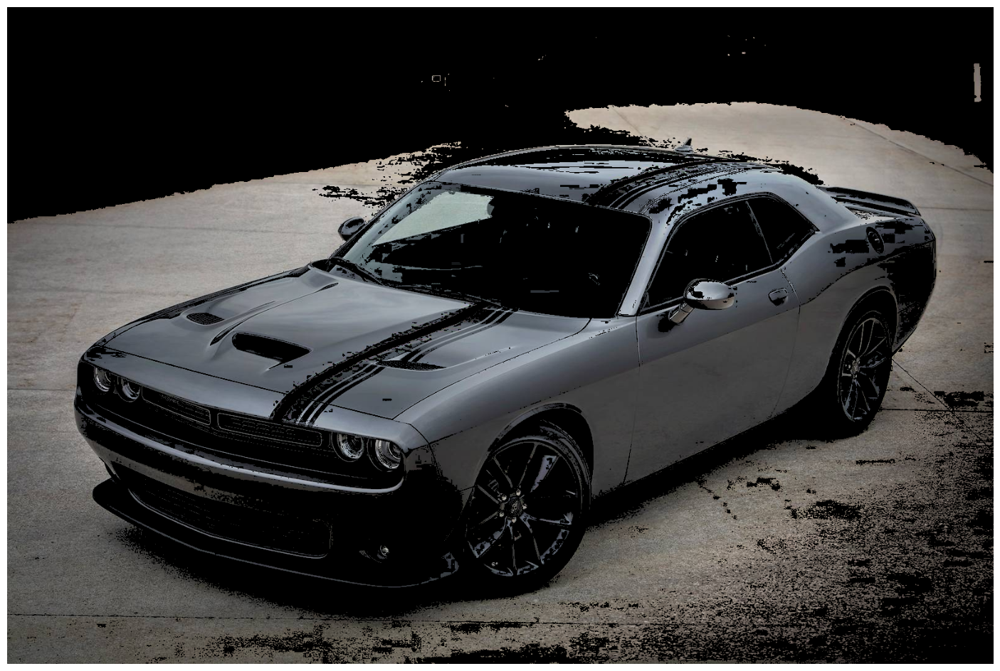

In [ ]:
output_image = np.zeros_like(image_rgb)
output_image[mask > 0] = masked_image[mask > 0]

plt.figure(figsize=(22, 12))
plt.imshow(output_image)
plt.axis('off')
plt.show()

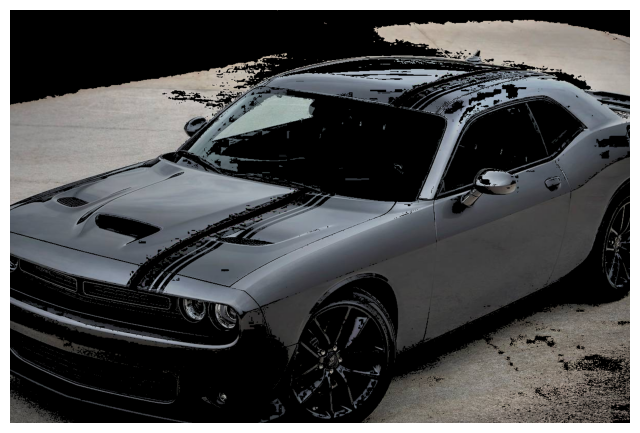

In [ ]:
crop_height = 800
crop_width = 1200

center_y, center_x = output_image.shape[0] // 2, output_image.shape[1] // 2

start_y = max(center_y - crop_height // 2, 0)
start_x = max(center_x - crop_width // 2, 0)
end_y = start_y + crop_height
end_x = start_x + crop_width
cropped_hw_image = output_image[start_y:end_y, start_x:end_x]

plt.figure(figsize=(8, 6))
plt.imshow(cropped_hw_image)
plt.axis('off')
plt.show()

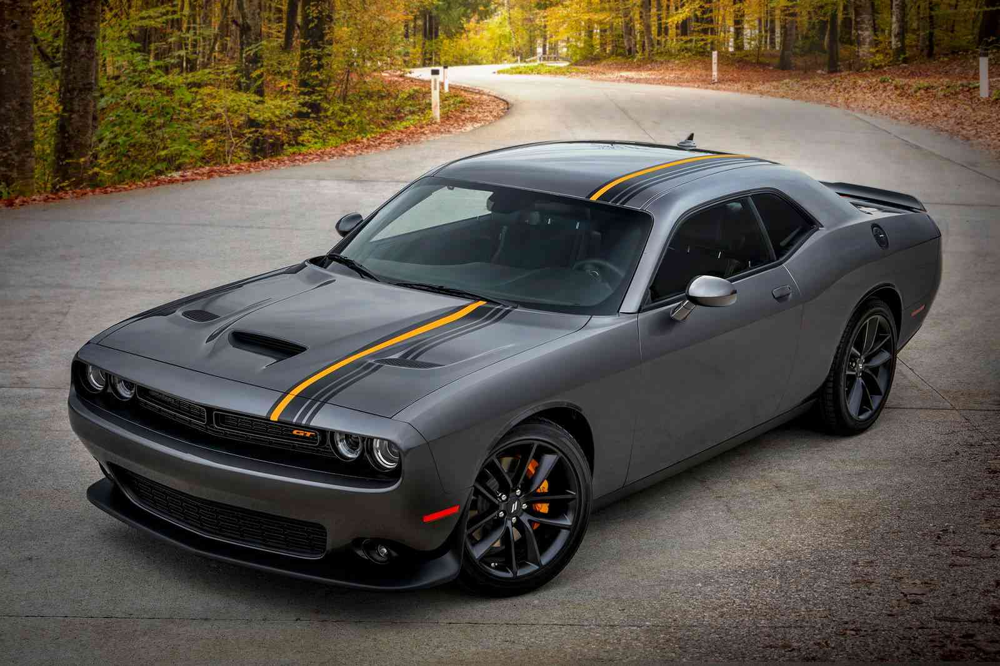

In [ ]:
input_path = "/content/challenger.jpg"
output_path = "/content/challenger2.jpg"

image = Image.open(input_path)
image.save(output_path, quality=30)

output_path = "/content/challenger2.jpg"
image = Image.open(output_path)
image

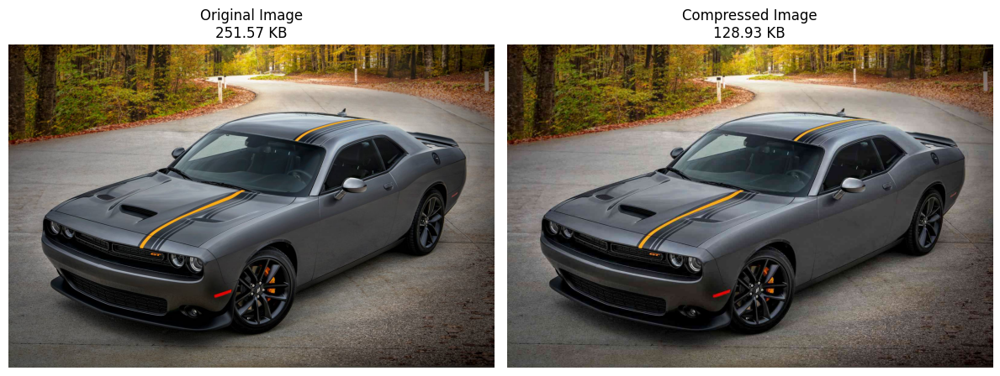

((1600, 1067), (1600, 1067))

In [ ]:
import os
import matplotlib.pyplot as plt

original_size = os.path.getsize(input_path)
compressed_size = os.path.getsize(output_path)

original_image = Image.open(input_path)
compressed_image = Image.open(output_path)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(original_image)
axes[0].set_title(f'Original Image\n{original_size / 1024:.2f} KB')
axes[0].axis('off')

axes[1].imshow(compressed_image)
axes[1].set_title(f'Compressed Image\n{compressed_size / 1024:.2f} KB')
axes[1].axis('off')

plt.tight_layout()
plt.show()

(original_image.size, compressed_image.size)

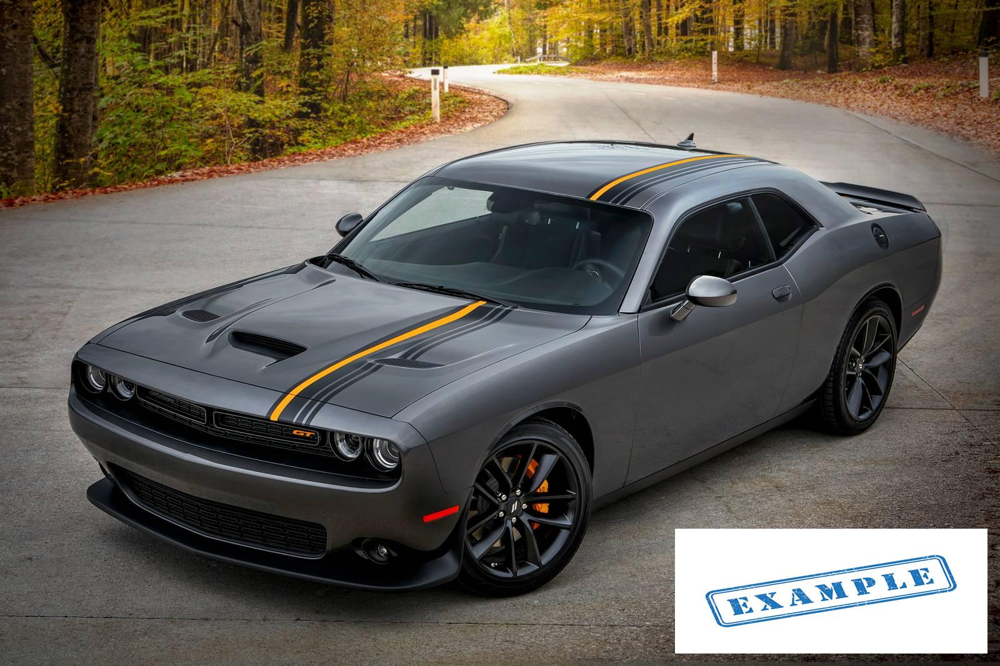

In [ ]:
watermark_path = "/content/watermark.jpg"
base_image_path = input_path
output_watermarked_path = "/content/watermark2.jpg"

base_image = Image.open(base_image_path).convert("RGBA")
watermark = Image.open(watermark_path).convert("RGBA")

watermark = watermark.resize((500, 200))

watermark_layer = Image.new("RGBA", base_image.size, (0, 0, 0, 0))

position = (base_image.width - watermark.width - 20, base_image.height - watermark.height - 20)
watermark_layer.paste(watermark, position, watermark)

combined = Image.alpha_composite(base_image, watermark_layer)

combined = combined.convert("RGB")
combined.save(output_watermarked_path)

output_watermarked_path
watermarked_image = Image.open(output_watermarked_path)
watermarked_image

Watermark blended and saved!


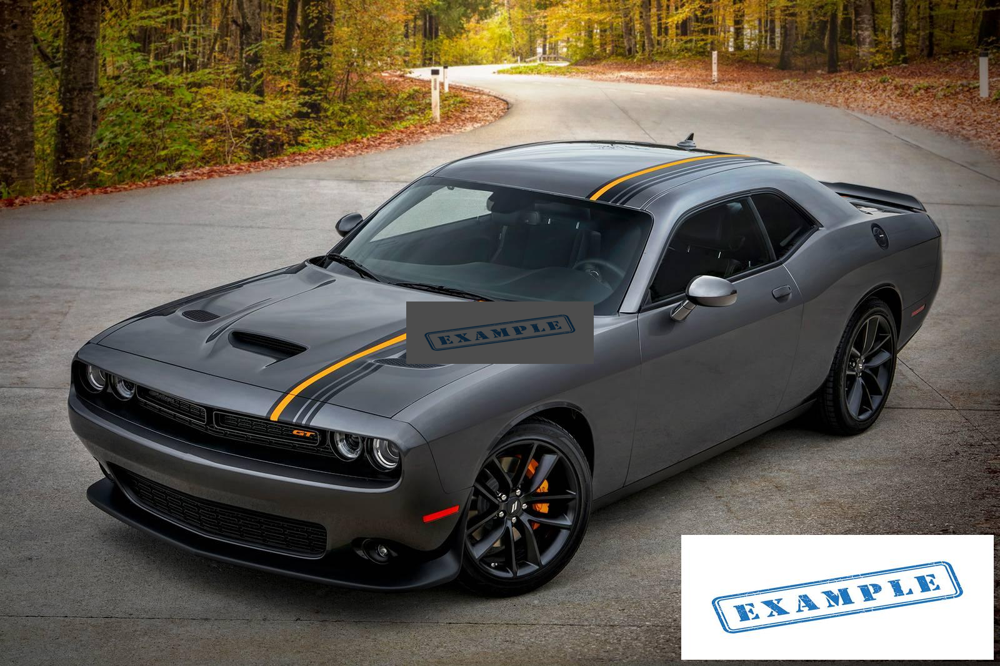

In [ ]:
from PIL import Image, ImageEnhance

base_image = Image.open("/content/watermark2.jpg").convert("RGBA")
watermark = Image.open("/content/watermark.jpg").convert("RGBA")

watermark = watermark.resize((300, 100))

alpha = 0.3
enhancer = ImageEnhance.Brightness(watermark)
watermark = enhancer.enhance(alpha)
layer = Image.new("RGBA", base_image.size, (0, 0, 0, 0))

x = (base_image.width - watermark.width) // 2
y = (base_image.height - watermark.height) // 2
layer.paste(watermark, (x, y), watermark)

blended = Image.alpha_composite(base_image, layer)

blended.convert("RGB").save("blended_watermarked_image.jpg")

print("Watermark blended and saved!")
blended

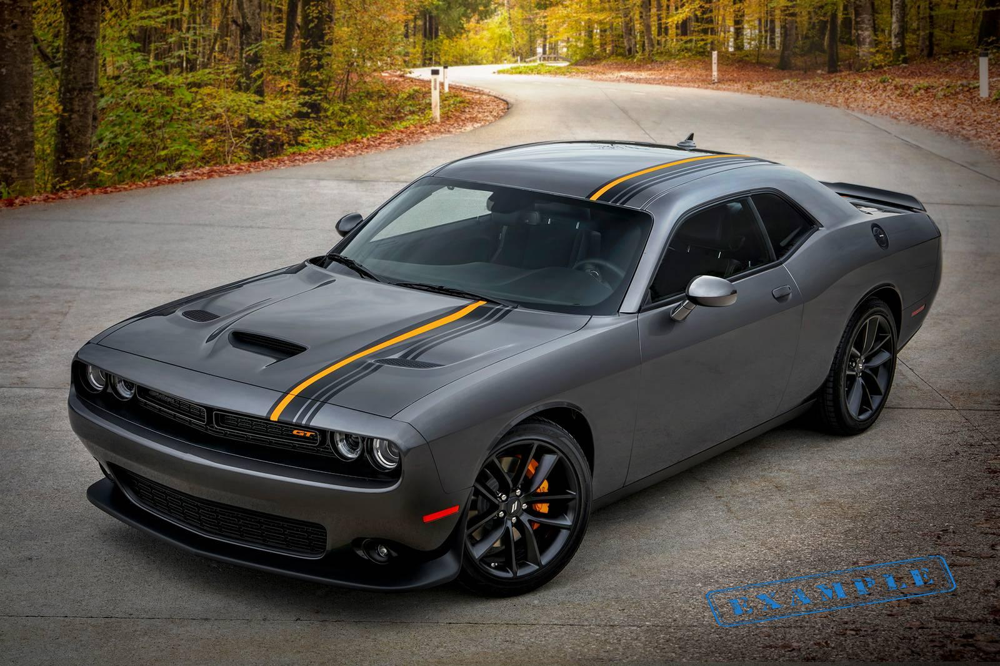

In [ ]:
watermark_path = "/content/watermark-removebg-preview.png"
base_image_path = input_path
output_watermarked_path = "/content/watermark2.jpg"

base_image = Image.open(base_image_path).convert("RGBA")
watermark = Image.open(watermark_path).convert("RGBA")

watermark = watermark.resize((500, 200))

watermark_layer = Image.new("RGBA", base_image.size, (0, 0, 0, 0))

position = (base_image.width - watermark.width - 20, base_image.height - watermark.height - 20)
watermark_layer.paste(watermark, position, watermark)

combined = Image.alpha_composite(base_image, watermark_layer)

combined = combined.convert("RGB")
combined.save(output_watermarked_path)

output_watermarked_path
watermarked_image = Image.open(output_watermarked_path)
watermarked_image

An error occurred: images do not match
